In [59]:
import os
import math
import time
import cv2
# import pymeshlab could not load due to error
import trimesh
import numpy as np
import pandas as pd
import open3d as o3d
import pyrealsense2 as rs
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import tkinter as tk
from tkinter import *
from pandastable import Table, TableModel
from datetime import datetime
from unittest.mock import Mock
from mpl_toolkits import mplot3d


print("All essential library loaded")

All essential library loaded


In [62]:
class AppState:
    
    def __init__(self, *args, **kwargs):
        self.WIN_NAME = 'RealSense'
        self.pitch, self.yaw = math.radians(-10), math.radians(-15)
        self.translation = np.array([0, 0, -1], dtype=np.float32)
        self.distance = 2
        self.prev_mouse = 0, 0
        self.mouse_btns = [False, False, False]
        self.paused = False
        self.decimate = 1
        self.scale = True
        self.color = True

    def reset(self):
        self.pitch, self.yaw, self.distance = 0, 0, 2
        self.translation[:] = 0, 0, -1

    @property
    def rotation(self):
        Rx, _ = cv2.Rodrigues((self.pitch, 0, 0))
        Ry, _ = cv2.Rodrigues((0, self.yaw, 0))
        return np.dot(Ry, Rx).astype(np.float32)

    @property
    def pivot(self):
        return self.translation + np.array((0, 0, self.distance), dtype=np.float32)

state = AppState()

#timestamp & counter
timestr = datetime.now().strftime("%Y_%m%d_%H-%M_")
random_counter = 0
img_counter = 0
ply_counter = 0
print(timestr)

# Configure depth and color streams
pipeline = rs.pipeline()
config = rs.config()

pipeline_wrapper = rs.pipeline_wrapper(pipeline)
pipeline_profile = config.resolve(pipeline_wrapper)
device = pipeline_profile.get_device()

found_rgb = False
for s in device.sensors:
    if s.get_info(rs.camera_info.name) == 'RGB Camera':
        found_rgb = True
        break
if not found_rgb:
    print("Depth camera with Color sensor is required!")
    exit(0)

config.enable_stream(rs.stream.depth, rs.format.z16, 30)
config.enable_stream(rs.stream.color, rs.format.bgr8, 30)

# Start streaming
pipeline.start(config)

# Get stream profile and camera intrinsics
profile = pipeline.get_active_profile()
depth_profile = rs.video_stream_profile(profile.get_stream(rs.stream.depth))
depth_intrinsics = depth_profile.get_intrinsics()
w, h = depth_intrinsics.width, depth_intrinsics.height

# Processing blocks
pc = rs.pointcloud()
decimate = rs.decimation_filter()
decimate.set_option(rs.option.filter_magnitude, 2 ** state.decimate)
colorizer = rs.colorizer()


def mouse_cb(event, x, y, flags, param):

    if event == cv2.EVENT_LBUTTONDOWN:
        state.mouse_btns[0] = True

    if event == cv2.EVENT_LBUTTONUP:
        state.mouse_btns[0] = False

    if event == cv2.EVENT_RBUTTONDOWN:
        state.mouse_btns[1] = True

    if event == cv2.EVENT_RBUTTONUP:
        state.mouse_btns[1] = False

    if event == cv2.EVENT_MBUTTONDOWN:
        state.mouse_btns[2] = True

    if event == cv2.EVENT_MBUTTONUP:
        state.mouse_btns[2] = False

    if event == cv2.EVENT_MOUSEMOVE:

        h, w = out.shape[:2]
        dx, dy = x - state.prev_mouse[0], y - state.prev_mouse[1]

        if state.mouse_btns[0]:
            state.yaw += float(dx) / w * 2
            state.pitch -= float(dy) / h * 2

        elif state.mouse_btns[1]:
            dp = np.array((dx / w, dy / h, 0), dtype=np.float32)
            state.translation -= np.dot(state.rotation, dp)

        elif state.mouse_btns[2]:
            dz = math.sqrt(dx**2 + dy**2) * math.copysign(0.01, -dy)
            state.translation[2] += dz
            state.distance -= dz

    if event == cv2.EVENT_MOUSEWHEEL:
        dz = math.copysign(0.1, flags)
        state.translation[2] += dz
        state.distance -= dz

    state.prev_mouse = (x, y)


cv2.namedWindow(state.WIN_NAME, cv2.WINDOW_AUTOSIZE)
cv2.resizeWindow(state.WIN_NAME, w, h)
cv2.setMouseCallback(state.WIN_NAME, mouse_cb)


def project(v):
    """project 3d vector array to 2d"""
    h, w = out.shape[:2]
    view_aspect = float(h)/w

    # ignore divide by zero for invalid depth
    with np.errstate(divide='ignore', invalid='ignore'):
        proj = v[:, :-1] / v[:, -1, np.newaxis] * \
            (w*view_aspect, h) + (w/2.0, h/2.0)

    # near clipping
    znear = 0.03
    proj[v[:, 2] < znear] = np.nan
    return proj


def view(v):
    """apply view transformation on vector array"""
    return np.dot(v - state.pivot, state.rotation) + state.pivot - state.translation


def line3d(out, pt1, pt2, color=(0x80, 0x80, 0x80), thickness=1):
    """draw a 3d line from pt1 to pt2"""
    p0 = project(pt1.reshape(-1, 3))[0]
    p1 = project(pt2.reshape(-1, 3))[0]
    if np.isnan(p0).any() or np.isnan(p1).any():
        return
    p0 = tuple(p0.astype(int))
    p1 = tuple(p1.astype(int))
    rect = (0, 0, out.shape[1], out.shape[0])
    inside, p0, p1 = cv2.clipLine(rect, p0, p1)
    if inside:
        cv2.line(out, p0, p1, color, thickness, cv2.LINE_AA)


def grid(out, pos, rotation=np.eye(3), size=1, n=10, color=(0x80, 0x80, 0x80)):
    """draw a grid on xz plane"""
    pos = np.array(pos)
    s = size / float(n)
    s2 = 0.5 * size
    for i in range(0, n+1):
        x = -s2 + i*s
        line3d(out, view(pos + np.dot((x, 0, -s2), rotation)),
               view(pos + np.dot((x, 0, s2), rotation)), color)
    for i in range(0, n+1):
        z = -s2 + i*s
        line3d(out, view(pos + np.dot((-s2, 0, z), rotation)),
               view(pos + np.dot((s2, 0, z), rotation)), color)


def axes(out, pos, rotation=np.eye(3), size=0.075, thickness=2):
    """draw 3d axes"""
    line3d(out, pos, pos +
           np.dot((0, 0, size), rotation), (0xff, 0, 0), thickness)
    line3d(out, pos, pos +
           np.dot((0, size, 0), rotation), (0, 0xff, 0), thickness)
    line3d(out, pos, pos +
           np.dot((size, 0, 0), rotation), (0, 0, 0xff), thickness)


def frustum(out, intrinsics, color=(0x40, 0x40, 0x40)):
    """draw camera's frustum"""
    orig = view([0, 0, 0])
    w, h = intrinsics.width, intrinsics.height

    for d in range(1, 6, 2):
        def get_point(x, y):
            p = rs.rs2_deproject_pixel_to_point(intrinsics, [x, y], d)
            line3d(out, orig, view(p), color)
            return p

        top_left = get_point(0, 0)
        top_right = get_point(w, 0)
        bottom_right = get_point(w, h)
        bottom_left = get_point(0, h)

        line3d(out, view(top_left), view(top_right), color)
        line3d(out, view(top_right), view(bottom_right), color)
        line3d(out, view(bottom_right), view(bottom_left), color)
        line3d(out, view(bottom_left), view(top_left), color)


def pointcloud(out, verts, texcoords, color, painter=True):
    """draw point cloud with optional painter's algorithm"""
    if painter:
        # Painter's algo, sort points from back to front

        # get reverse sorted indices by z (in view-space)
        # https://gist.github.com/stevenvo/e3dad127598842459b68
        v = view(verts)
        s = v[:, 2].argsort()[::-1]
        proj = project(v[s])
    else:
        proj = project(view(verts))

    if state.scale:
        proj *= 0.5**state.decimate

    h, w = out.shape[:2]

    # proj now contains 2d image coordinates
    j, i = proj.astype(np.uint32).T

    # create a mask to ignore out-of-bound indices
    im = (i >= 0) & (i < h)
    jm = (j >= 0) & (j < w)
    m = im & jm

    cw, ch = color.shape[:2][::-1]
    if painter:
        # sort texcoord with same indices as above
        # texcoords are [0..1] and relative to top-left pixel corner,
        # multiply by size and add 0.5 to center
        v, u = (texcoords[s] * (cw, ch) + 0.5).astype(np.uint32).T
    else:
        v, u = (texcoords * (cw, ch) + 0.5).astype(np.uint32).T
    # clip texcoords to image
    np.clip(u, 0, ch-1, out=u)
    np.clip(v, 0, cw-1, out=v)

    # perform uv-mapping
    out[i[m], j[m]] = color[u[m], v[m]]


out = np.empty((h, w, 3), dtype=np.uint8)

while True:
    # Grab camera data
    if not state.paused:
        # Wait for a coherent pair of frames: depth and color
        frames = pipeline.wait_for_frames()

        depth_frame = frames.get_depth_frame()
        color_frame = frames.get_color_frame()

        depth_frame = decimate.process(depth_frame)

        # Grab new intrinsics (may be changed by decimation)
        depth_intrinsics = rs.video_stream_profile(
            depth_frame.profile).get_intrinsics()
        w, h = depth_intrinsics.width, depth_intrinsics.height

        depth_image = np.asanyarray(depth_frame.get_data())
        color_image = np.asanyarray(color_frame.get_data())

        depth_colormap = np.asanyarray(
            colorizer.colorize(depth_frame).get_data())

        if state.color:
            mapped_frame, color_source = color_frame, color_image
        else:
            mapped_frame, color_source = depth_frame, depth_colormap

        points = pc.calculate(depth_frame)
        pc.map_to(mapped_frame)

        # Pointcloud data to arrays
        v, t = points.get_vertices(), points.get_texture_coordinates()
        verts = np.asanyarray(v).view(np.float32).reshape(-1, 3)  # xyz
        texcoords = np.asanyarray(t).view(np.float32).reshape(-1, 2)  # uv

    # Render
    now = time.time()

    out.fill(0)

    grid(out, (0, 0.5, 1), size=1, n=10)
    frustum(out, depth_intrinsics)
    axes(out, view([0, 0, 0]), state.rotation, size=0.1, thickness=1)

    if not state.scale or out.shape[:2] == (h, w):
        pointcloud(out, verts, texcoords, color_source)
    else:
        tmp = np.zeros((h, w, 3), dtype=np.uint8)
        pointcloud(tmp, verts, texcoords, color_source)
        tmp = cv2.resize(
            tmp, out.shape[:2][::-1], interpolation=cv2.INTER_NEAREST)
        np.putmask(out, tmp > 0, tmp)

    if any(state.mouse_btns):
        axes(out, view(state.pivot), state.rotation, thickness=4)

    dt = time.time() - now

    cv2.setWindowTitle(
        state.WIN_NAME, "RealSense (%dx%d) %dFPS (%.2fms) %s" %
        (w, h, 1.0/dt, dt*1000, "PAUSED" if state.paused else ""))

    cv2.imshow(state.WIN_NAME, out)
    key = cv2.waitKey(1)

    if key == ord("r"):
        state.reset()

    if key == ord("p"):
        state.paused ^= True

    if key == ord("d"):
        state.decimate = (state.decimate + 1) % 3
        decimate.set_option(rs.option.filter_magnitude, 2 ** state.decimate)

    if key == ord("z"):
        state.scale ^= True

    if key == ord("c"):
        state.color ^= True

    if key == ord("s"):
        img_name = timestr + str(img_counter) + ".png"
        cv2.imwrite(img_name, out)
        img_counter += 1

#-------------- Saving the .ply file and naming it based on the timestamp--------------------
    if key == ord("e"):
        ply_name = timestr + str(ply_counter)+".ply"
        points.export_to_ply(ply_name, mapped_frame,)
        ply_counter += 1

    if key in (27, ord("q")) or cv2.getWindowProperty(state.WIN_NAME, cv2.WND_PROP_AUTOSIZE) < 0:
        cv2.destroyAllWindows()
        break

# Stop streaming
pipeline.stop()

#Checking saved ply file 
print("Importing ply file for object generation")
file_list = []
#Check all .ply files currently exist
for file in os.listdir():
    if file.endswith(".ply"):
        file_list.append(file)
df = pd.DataFrame(file_list,columns=["Index Reference "])

class display_df(Frame):
        def __init__(self, parent=None):
            self.parent = parent
            Frame.__init__(self)
            self.main = self.master
            self.main.geometry('600x400+200+100')
            self.main.title('Table app')
            f = Frame(self.main)
            f.pack(fill=BOTH,expand=1)
            self.table = pt = Table(f, dataframe=df,
                                    showtoolbar=True, showstatusbar=True)
            pt.show()
            return

app = display_df()
app.mainloop()

# ----------------------------Reading .ply file----------------------------
pcd = o3d.io.read_point_cloud(file_list[int(input("Type index of the ply for visulization"))])
print(pcd)

# ----------------------------Viewing at 1024 x 768 ----------------------------
o3d.visualization.draw_geometries([pcd],
                                  window_name="PCD Viewer",
                                  width=1024, height=768)

# Return whether the point cloud is 2D/3D
print(pcd.dimension())

# Return the geometry type handled
print(pcd.get_geometry_type())

# Return the max & min bound of the INPUT point cloud data
print(f'The maximum bound of input file is {pcd.get_max_bound()}')
print(f'The minimum bound of input file is {pcd.get_min_bound()}')


2022_0727_14-50_
Importing ply file for object generation
PointCloud with 77002 points.
3
Type.PointCloud
The maximum bound of input file is [ 1.32129   0.680664 -0.168579]
The minimum bound of input file is [-0.995605 -0.425049 -1.40625 ]


In [ ]:
import tkinter as tk
 
window = tk.Tk()
window.title('My Window')
window.geometry('500x300') 
 
e1 = tk.Entry(window, show=None, font=('Arial', 14))  
e2 = tk.Entry(window, show='*', font=('Arial', 14))   
e1.pack()
e2.pack()
 
window.mainloop()




In [57]:
#Button GUI

class display_df(tk.Tk):
        def __init__(self, parent=None):
            self.parent = parent
            Frame.__init__(self)
            self.main = self.master
            self.main.geometry('600x400+200+100')
            self.main.title('Table app')
            window = tk.Tk()

            e1 = tk.Entry(window, show=None, font=('Arial', 14))   
            e1.pack()

            f = Frame(self.main)
            f.pack(fill=BOTH,expand=1)
            self.table = pt = Table(f, dataframe=df,
                                    showtoolbar=True, showstatusbar=True)
            pt.show()
            return

app = display_df()
app.mainloop()
print(e1)

.!entry


In [ ]:
import tkinter as tk

class MyApp(tk.Tk):
    def __init__(self):
        tk.Tk.__init__(self)
        self.entry = tk.Entry(self)
        self.entry.pack()
        close_button = tk.Button(self, text="Close", command=self.close)
        close_button.pack()
        self.string = ""

    def close(self):
        global result
        self.string = self.entry.get()
        self.destroy()

    def mainloop(self):
        tk.Tk.mainloop(self)
        return self.string

print ("enter a string in the GUI")
app = MyApp()
result = app.mainloop()
print ("you entered:", result)

enter a string in the GUI
you entered: gg


In [ ]:
file_list = []
#Check all .ply files currently exist
for file in os.listdir():
    if file.endswith(".ply"):
        file_list.append(file)

df = pd.DataFrame(file_list,columns=["Index Reference"])
df

class MyApp():
    def __init__(self, master):
        self.master = master
        master.title("My App")
        frame = Toplevel(self.master) #this is the new window
        self.table = Table(frame, dataframe=self.get_data(), showtoolbar=True, showstatusbar=True)
        self.table.show()
        #self.button1 = Button(master, text="Display df", command=self.display_df_in_new_window)
        #self.button1.place(x=60, y=100,height = 44, width = 127)

    def get_data(self):
      ##code to get data
        return df

    '''def display_df_in_new_window(self):
       frame = Toplevel(self.master) #this is the new window
       self.table = Table(frame, dataframe=self.get_data(), showtoolbar=True, showstatusbar=True)
       self.table.show()'''

root = Tk()
my_gui = MyApp(root)
root.geometry("600x450")
root.mainloop()

TclError: image "pyimage192" doesn't exist

In [67]:
# ----------------------------Reading .ply file----------------------------
#pcd = o3d.io.read_point_cloud(file_list[int(input("Type index of the ply for visulization"))])
pcd = o3d.io.read_point_cloud("2022_0727_14-50_0.ply")
print(pcd)

# ----------------------------Viewing at 1024 x 768 ----------------------------
o3d.visualization.draw_geometries([pcd],
                                  window_name="PCD Viewer",
                                  width=1024, height=768)

# Return whether the point cloud is 2D/3D
print(pcd.dimension())

# Return the geometry type handled
print(pcd.get_geometry_type())

# Return the max & min bound of the INPUT point cloud data
print(f'The maximum bound of input file is {pcd.get_max_bound()}')
print(f'The minimum bound of input file is {pcd.get_min_bound()}')

PointCloud with 87156 points.
3
Type.PointCloud
The maximum bound of input file is [ 0.32745785  0.19476892 -0.29300001]
The minimum bound of input file is [-0.28387418 -0.22018541 -0.38700002]


In [66]:
# ------------------------------Cropping ------------------------------
vol = o3d.visualization.SelectionPolygonVolume()

# ------------------------Defining Polygon for Cropping-----------------------
#original
'''
bounding_polygon = np.array([
    [0.251,0.292,-0.54],
    [-0.271,0.292,-0.54],
    [-0.271,-0.157,-0.54],
    [0.271,-0.157,-0.54],
    [0.271,-0.157,-0.4],
    [-0.271,-0.157,-0.4],
    [-0.271,0.292,-0.4],
    [0.251,0.292,-0.4]
], dtype=np.float64)
'''

#able to get a surface free of bars

bounding_polygon = np.array([
    [0.24,0.29,-0.54],
    [-0.24,0.29,-0.54],
    [-0.24,-0.15,-0.54],
    [0.24,-0.15,-0.54],
], dtype=np.float64)


'''
bounding_polygon = np.array([
    [-0.292,-0.301,-0.277],
    [-0.262,-0.301,-0.2777],
    [-0.292,-0.301,-0.531],
    [-0.262, -0.301, -0.530],
    [-0.312, 0.316, -0.277],
    [0.251,0.297, -0.277],
    [-0.312,0.316,-0.423],
    [0.251,0.297,-0.5]
], dtype=np.float64)
'''

print("Cropping coordinates：\n", bounding_polygon)
vol.bounding_polygon = o3d.utility.Vector3dVector(bounding_polygon)
# ------------------------Setting max and min axis-----------------------
vol.orthogonal_axis = "z"
vol.axis_min = -1  # Min axis value
vol.axis_max = 1   # Max axis value

# ------------------------------Cropping PCD----------------------------------
crop_pcd = vol.crop_point_cloud(pcd)
print(crop_pcd)

# -----------------------------Viewing Cropped PCD---------------------------------
o3d.visualization.draw_geometries([crop_pcd],
                                  window_name="Cropped PCD",
                                  width=1024, height=728)

Cropping coordinates：
 [[ 0.24  0.29 -0.54]
 [-0.24  0.29 -0.54]
 [-0.24 -0.15 -0.54]
 [ 0.24 -0.15 -0.54]]
PointCloud with 62434 points.


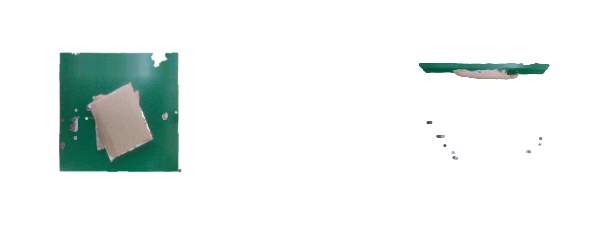

In [ ]:
#matplot visulization for coordinates
cloud = crop_pcd

points = np.asarray(cloud.points)

colors = None
if cloud.has_colors():
    colors = np.asarray(cloud.colors)
elif cloud.has_normals():
    colors = (0.5, 0.5, 0.5) + np.asarray(cloud.normals) * 0.5
else:
    geometry.paint_uniform_color((1.0, 0.0, 0.0))
    colors = np.asarray(geometry.colors)

# Multi View
figsize = plt.rcParams.get('figure.figsize')
fig = plt.figure(figsize=(figsize[0] * 2, figsize[1]))
ax1 = fig.add_subplot(1, 2, 1, projection = '3d')
ax2 = fig.add_subplot(1, 2, 2, projection = '3d')
ax1.axis("off")
ax1.view_init(90, -90) # front view
ax1.scatter(points[:,0], points[:,1], points[:,2], s=1, c=colors)
ax2.axis("off")
ax2.view_init(90 + 90, -90) # top view
ax2.scatter(points[:,0], points[:,1], points[:,2], s=1, c=colors)
plt.show()

import plotly.graph_objects as go
fig = go.Figure(
    data=[
        go.Scatter3d(
            x=points[:,0], y=points[:,1], z=points[:,2], 
            mode='markers',
            marker=dict(size=1, color=colors)
        )
    ],
    layout=dict(
        scene=dict(
            xaxis=dict(visible=False),
            yaxis=dict(visible=False),
            zaxis=dict(visible=False)
        )
    )
)
fig.show()

In [ ]:
# ------------------------------Outlier Indicator------------------------------
def display_inlier_outlier(cloud, ind):
    inlier_cloud = cloud.select_by_index(ind)
    outlier_cloud = cloud.select_by_index(ind, invert=True)

    print("Showing outliers (red) and inliers (gray): ")
    outlier_cloud.paint_uniform_color([1, 0, 0])
    inlier_cloud.paint_uniform_color([0.8, 0.8, 0.8])
    o3d.visualization.draw_geometries([inlier_cloud, outlier_cloud],width=1024, height=728)

# ------------------------------Noise Processing ()------------------------------
# CAN DO COMPARISON IN CAPSTONE PROJECT
print("\nDownsampled the point cloud with a voxel of 0.004")
voxel_down_pcd = crop_pcd.voxel_down_sample(voxel_size=0.004)

'''
# Statstical Outlier Removal
cl,ind = voxel_down_pcd.remove_statistical_outlier(nb_neighbors=60,std_ratio=6)
print("Outlier Processed (Statstical Removal)")
display_inlier_outlier(voxel_down_pcd, ind)'''

# Radius Outlier Removal
cl, ind = voxel_down_pcd.remove_radius_outlier(nb_points=100, radius=0.05)
print("Outlier Processed (Radius Removal)")
display_inlier_outlier(voxel_down_pcd, ind)


Downsampled the point cloud with a voxel of 0.004
Outlier Processed (Radius Removal)
Showing outliers (red) and inliers (gray): 


In [ ]:
# ------------------------------File Saving------------------------------
o3d.io.write_point_cloud("sample_saved.ply",cl)

# ----------------------------Reading Saved PCD file----------------------------
model = o3d.io.read_point_cloud("sample_saved.ply")
print(model)

#test for mesh

print("Testing IO for meshes ...")
mesh = o3d.io.read_triangle_mesh("sample_saved.ply")
print(mesh)
o3d.io.write_triangle_mesh("mesh.ply", mesh)


# ----------------------------Viewing at 1024 x 768 ----------------------------
o3d.visualization.draw_geometries([model],
                                  window_name="PCD Viewer",
                                  width=1024, height=768)

PointCloud with 14039 points.
Testing IO for meshes ...
[Open3D WARNING] geometry::TriangleMesh appears to be a geometry::PointCloud (only contains vertices, but no triangles).
TriangleMesh with 14039 points and 0 triangles.


In [ ]:
pcd = o3d.io.read_point_cloud("sample_saved.ply")
pcd.estimate_normals()


# estimate radius for rolling ball
distances = pcd.compute_nearest_neighbor_distance()
avg_dist = np.mean(distances)
radius = 2 * avg_dist   


#Mesh created from ball pivoting
mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_ball_pivoting(
           pcd,
           o3d.utility.DoubleVector([radius, radius * 2]))
           
'''
#Mesh created from poisson mthod
mesh =  o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(
    pcd,
    depth=8, width=0)
    '''

# create the triangular mesh with the vertices and faces from open3d
tri_mesh = trimesh.Trimesh(np.asarray(mesh.vertices), np.asarray(mesh.triangles),
                          vertex_normals=np.asarray(mesh.vertex_normals),vertex_colors = np.asarray(mesh.vertex_colors))

#save as object file which can be loaded into unity 3d
#saved_name = "saved_sample"+str(random_counter)+".obj"
trimesh.exchange.export.export_mesh(tri_mesh, "meshed_sample.obj")

#save as ply for further surface reconstruction
#saved_name = "saved_sample"+str(random_counter)+".ply"
trimesh.exchange.export.export_mesh(tri_mesh, "meshed_sample.ply")



b'ply\nformat binary_little_endian 1.0\ncomment https://github.com/mikedh/trimesh\nelement vertex 13787\nproperty float x\nproperty float y\nproperty float z\nproperty float nx\nproperty float ny\nproperty float nz\nproperty uchar red\nproperty uchar green\nproperty uchar blue\nproperty uchar alpha\nelement face 25891\nproperty list uchar int vertex_indices\nend_header\n\x00\xc0\xf6=\x00`J>\x00\x00\n\xbfa\xca\x9d<o\xeaU\xbdd\x9a\x7f?X\x93\x91\xff\x00@I>\x00p\x90>\x00@\x0b\xbf\xd0,\x00\xbe\xbb|\x8a\xbc"\xf3}?)z[\xff\x00\x90\x1f\xbe\x00\x80s>\x00\x00\x0b\xbf5s\xba\xbds\x17\x93<<\xe5~?4p]\xff\x00\x00\x03\xbe\x00\x80\xf2=\x00 \n\xbf)\'*\xbde\xa0D>\xd2\x02{?\t^E\xff\x00\xa0s=\x000\x8c>\x00\x00\x0b\xbfk\xe60=\xc6\x9d\xbf\xbb\xbb\xc1\x7f?X\x8e\x89\xff\x00\x80H\xbe\x00\x80\xe9\xbd\x00 \t\xbf\x10B <\xd2DJ=\xe8\xac\x7f?\x15jO\xff\x00\x00\x07\xbe\x00\xb0\x90>\x00\x80\x0b\xbf\x95\x1a\xa9;\xc7\x8a\x91=mY\x7f?"|m\xff\x00\xe0X>\x00@\xa8=\x00`\t\xbfK\x85\xc6\xbd\xbb\xdc\xdd=\xdbG}?+q^\xff\x00\xa0\xec=

In [ ]:
vertex_color = np.asarray(mesh.vertex_colors)
print(vertex_color)

[[0.34509804 0.57647059 0.56862745]
 [0.16078431 0.47843137 0.35686275]
 [0.20392157 0.43921569 0.36470588]
 ...
 [0.10196078 0.41960784 0.29803922]
 [0.05882353 0.38823529 0.28235294]
 [0.09803922 0.40784314 0.29019608]]


In [ ]:
print("Testing IO for meshes after meshing...")
mesh = o3d.io.read_triangle_mesh("meshed_sample.ply")
print(mesh)
#o3d.io.write_triangle_mesh("mesh.ply", mesh)

Testing IO for meshes after meshing...
TriangleMesh with 13787 points and 25891 triangles.


In [ ]:
'''
#Successful Object Reconstruction
mesh_model= o3d.io.read_point_cloud("sample_saved.ply")
tetra_mesh, pt_map = o3d.geometry.TetraMesh.create_from_point_cloud(mesh_model)
alpha = 12
mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_alpha_shape(
        pcd, alpha, tetra_mesh, pt_map)
mesh.compute_vertex_normals()
o3d.visualization.draw_geometries([mesh], mesh_show_back_face=False)
'''
mesh_model= o3d.io.read_point_cloud("meshed_sample.ply")
print('run Poisson surface reconstruction')
with o3d.utility.VerbosityContextManager(
        o3d.utility.VerbosityLevel.Debug) as cm:
    mesh, densities = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(
        mesh_model, depth=12)
print(mesh)
o3d.visualization.draw_geometries([mesh])

'''
#Write the connected and processed mesh into the file 
o3d.io.write_triangle_mesh("mesh.ply", mesh)
'''

#CAN DO COMPARISON IN CAPSTONE PROJECT
'''for alpha in np.logspace(np.log10(0.5), np.log10(0.01), num=4):
    print(f"alpha={alpha:.3f}")
    mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_alpha_shape(
        pcd, alpha, tetra_mesh, pt_map)
    mesh.compute_vertex_normals()
    o3d.visualization.draw_geometries([mesh], mesh_show_back_face=True)'''

run Poisson surface reconstruction
[Open3D DEBUG] Input Points / Samples: 13787 / 13787
[Open3D DEBUG] #   Got kernel density: 0.26 (s), 397.906 (MB) / 425.508 (MB) / 474 (MB)
[Open3D DEBUG] #     Got normal field: 0.0710001 (s), 447.578 (MB) / 447.578 (MB) / 474 (MB)
[Open3D DEBUG] Point weight / Estimated Area: 9.211462e-05 / 1.269984e+00
[Open3D DEBUG] #       Finalized tree: 0.298 (s), 453.551 (MB) / 453.551 (MB) / 503 (MB)
[Open3D DEBUG] #  Set FEM constraints: 0.2 (s), 402.785 (MB) / 453.551 (MB) / 503 (MB)
[Open3D DEBUG] #Set point constraints: 0.052 (s), 402.418 (MB) / 453.551 (MB) / 503 (MB)
[Open3D DEBUG] Leaf Nodes / Active Nodes / Ghost Nodes: 1957376 / 162008 / 2074993
[Open3D DEBUG] Memory Usage: 402.422 MB
[Open3D DEBUG] # Linear system solved: 0.513 (s), 417.496 (MB) / 453.551 (MB) / 503 (MB)
[Open3D DEBUG] Got average: 0.0139999 (s), 406.668 (MB) / 453.551 (MB) / 503 (MB)
[Open3D DEBUG] Iso-Value: 5.040380e-01 = 6.949172e+03 / 1.378700e+04
[Open3D DEBUG] #          Tot

'for alpha in np.logspace(np.log10(0.5), np.log10(0.01), num=4):\n    print(f"alpha={alpha:.3f}")\n    mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_alpha_shape(\n        pcd, alpha, tetra_mesh, pt_map)\n    mesh.compute_vertex_normals()\n    o3d.visualization.draw_geometries([mesh], mesh_show_back_face=True)'

In [ ]:
#Mesh Filtering
print('create noisy mesh')
mesh_in = o3d.io.read_triangle_mesh("meshed_sample.ply")
vertices = np.asarray(mesh_in.vertices)
noise = 5
vertices += np.random.uniform(0, noise, size=vertices.shape)
mesh_in.vertices = o3d.utility.Vector3dVector(vertices)
mesh_in.compute_vertex_normals()
o3d.visualization.draw_geometries([mesh_in])

print('filter with average with 1 iteration')
mesh_out = mesh_in.filter_smooth_simple(number_of_iterations=1)
mesh_out.compute_vertex_normals()
o3d.visualization.draw_geometries([mesh_out])

print('filter with average with 5 iterations')
mesh_out = mesh_in.filter_smooth_simple(number_of_iterations=5)
mesh_out.compute_vertex_normals()
o3d.visualization.draw_geometries([mesh_out])

create noisy mesh
filter with average with 1 iteration
filter with average with 5 iterations


In [61]:
#Level of detail 3d model generation for unity 3d loadinhg

def lod_mesh_export(mesh, lods, extension, path):
    mesh_lods={}
    for i in lods:
        mesh_lod = mesh.simplify_quadric_decimation(i)
        o3d.io.write_triangle_mesh(path+"lod_"+str(i)+extension, mesh_lod)
        mesh_lods[i]=mesh_lod
    print("generation of "+str(i)+" LoD successful")
    return mesh_lods

my_lods = lod_mesh_export(mesh, [10000,1000,100], "l.obj", r"C:\Users\zhj3sgp\Documents\Capstone Project\model_")





NameError: name 'mesh' is not defined

In [ ]:
#Convert the mesh object from ply to obj which can then be loaded into the Unity 
mesh_pcd = o3d.io.read_point_cloud("mesh.ply")

# create the triangular mesh with the vertices and faces from open3d
mesh_mesh = trimesh.Trimesh(np.asarray(mesh.vertices), np.asarray(mesh.triangles),
                          vertex_normals=np.asarray(mesh.vertex_normals),vertex_colors = np.asarray(mesh.vertex_colors))

#save as object file which can be loaded into unity 3d
#saved_name = "saved_sample"+str(random_counter)+".obj"
trimesh.exchange.export.export_mesh(mesh_mesh, "meshed_sample.obj")


'# https://github.com/mikedh/trimesh\nv 0.23608398 0.28906250 -0.54003906 0.31372549 0.50196078 0.42352941\nv 0.23864746 0.28906250 -0.54003906 0.25490196 0.52156863 0.43137255\nv 0.15173340 0.07760620 -0.54101562 0.01960784 0.38431373 0.31764706\nv -0.14392090 0.03013611 -0.54199219 0.00000000 0.32941176 0.23137255\nv 0.19201660 0.27929688 -0.54589844 0.19215686 0.48627451 0.33725490\nv 0.15515137 0.07804362 -0.54101562 0.03529412 0.39607843 0.31764706\nv -0.12780762 -0.07751465 -0.53906250 0.00000000 0.35686275 0.24705882\nv 0.02428436 -0.14807129 -0.53466797 0.00784314 0.39215686 0.28627451\nv -0.21136475 -0.06613159 -0.54003906 0.04705882 0.34509804 0.24313725\nv -0.21826172 0.01851654 -0.54101562 0.06274510 0.33725490 0.25882353\nv -0.22021484 0.28955078 -0.54589844 0.08627451 0.38039216 0.31372549\nv -0.18164062 0.28759766 -0.54687500 0.09411765 0.44313725 0.37647059\nv -0.12780762 -0.07366943 -0.53906250 0.00000000 0.36470588 0.26274510\nv 0.12023926 0.01969910 -0.53808594 0.427